In [ ]:
import os
import tensorflow as tf
from tensorflow import keras
from tensorflow.keras import layers, optimizers, datasets
from matplotlib import pyplot as plt
import numpy as np
import tensorflow as tf
from keras.saving import register_keras_serializable

@register_keras_serializable()
def softmax_v2(x):
    return tf.nn.softmax(x)


In [ ]:
(x_train_raw, y_train_raw), (x_test_raw, y_test_raw) = datasets.mnist.load_data()

In [ ]:
print(x_train_raw.shape, y_train_raw.shape)
print(x_test_raw.shape, y_test_raw.shape)
print(x_train_raw[0])
print(y_train_raw[0])

(60000, 28, 28) (60000,)
(10000, 28, 28) (10000,)
[[  0   0   0   0   0   0   0   0   0   0   0   0   0   0   0   0   0   0
    0   0   0   0   0   0   0   0   0   0]
 [  0   0   0   0   0   0   0   0   0   0   0   0   0   0   0   0   0   0
    0   0   0   0   0   0   0   0   0   0]
 [  0   0   0   0   0   0   0   0   0   0   0   0   0   0   0   0   0   0
    0   0   0   0   0   0   0   0   0   0]
 [  0   0   0   0   0   0   0   0   0   0   0   0   0   0   0   0   0   0
    0   0   0   0   0   0   0   0   0   0]
 [  0   0   0   0   0   0   0   0   0   0   0   0   0   0   0   0   0   0
    0   0   0   0   0   0   0   0   0   0]
 [  0   0   0   0   0   0   0   0   0   0   0   0   3  18  18  18 126 136
  175  26 166 255 247 127   0   0   0   0]
 [  0   0   0   0   0   0   0   0  30  36  94 154 170 253 253 253 253 253
  225 172 253 242 195  64   0   0   0   0]
 [  0   0   0   0   0   0   0  49 238 253 253 253 253 253 253 253 253 251
   93  82  82  56  39   0   0   0   0   0]
 [  0   0   0 

In [ ]:
#convertendo rotulos em variaveis
num_classes = 10
y_train = keras.utils.to_categorical(y_train_raw, num_classes)
y_test = keras.utils.to_categorical(y_test_raw, num_classes)
print(y_train_raw[0])
print(y_train[0])

5
[0. 0. 0. 0. 0. 1. 0. 0. 0. 0.]


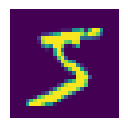

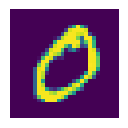

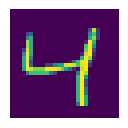

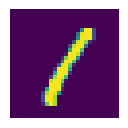

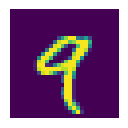

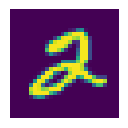

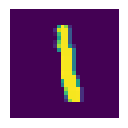

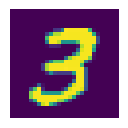

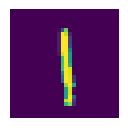

In [ ]:
plt.figure()
for i in range(9):
  plt.subplot(3,3,i+1)
  plt.imshow(x_train_raw[i])
  plt.axis('off')
  plt.show()

In [ ]:
#conversao de uma matriz (imagem) de 28 x 28 pra um vetor de 784 sem perder informação
x_train = x_train_raw.reshape(60000, 784)
x_test = x_test_raw.reshape(10000, 784)
x_train = x_train.astype('float32')/255
x_test = x_test.astype('float32')/255

In [ ]:
#criar um modelo de rede neural profunda(DNN) com tres camadas totalmente conectadas
model = keras.Sequential([
    layers.Dense(512, activation='relu', input_dim= 784),
    layers.Dense(256, activation='relu'),
    layers.Dense(128, activation='relu'),
    layers.Dense(num_classes, activation='softmax')
])
model.summary()

/usr/local/lib/python3.12/dist-packages/keras/src/layers/core/dense.py:93: UserWarning: Do not pass an `input_shape`/`input_dim` argument to a layer. When using Sequential models, prefer using an `Input(shape)` object as the first layer in the model instead.
  super().__init__(activity_regularizer=activity_regularizer, **kwargs)


Model: "sequential_8"

┏━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━┓
┃ Layer (type)                    ┃ Output Shape           ┃       Param # ┃
┡━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━┩
│ dense_12 (Dense)                │ (None, 512)            │       401,920 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_13 (Dense)                │ (None, 256)            │       131,328 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_14 (Dense)                │ (None, 128)            │        32,896 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_15 (Dense)                │ (None, 10)             │         1,290 │
└─────────────────────────────────┴────────────────────────┴───────────────┘

 Total params: 567,434 (2.16 MB)

 Trainable params: 567,434 (2.16 MB)

 Non-trainable params: 0 (0.00 B)

In [ ]:
Optimizer = optimizers. Adam (0.001)
model.compile(loss=keras.losses.categorical_crossentropy,optimizer=Optimizer,metrics=['accuracy'])

In [ ]:
#ajuste os dados de treinamento ao modelo e chame o metodo fit pra treinar!
history = model.fit(x_train, y_train,
batch_size=128,
epochs=10,
validation_data=(x_test, y_test),
verbose=1)

Epoch 1/10
469/469 ━━━━━━━━━━━━━━━━━━━━ 15s 29ms/step - accuracy: 0.8754 - loss: 0.4281 - val_accuracy: 0.9663 - val_loss: 0.1057
Epoch 2/10
469/469 ━━━━━━━━━━━━━━━━━━━━ 7s 16ms/step - accuracy: 0.9716 - loss: 0.0910 - val_accuracy: 0.9725 - val_loss: 0.0914
Epoch 3/10
469/469 ━━━━━━━━━━━━━━━━━━━━ 9s 20ms/step - accuracy: 0.9829 - loss: 0.0536 - val_accuracy: 0.9743 - val_loss: 0.0900
Epoch 4/10
469/469 ━━━━━━━━━━━━━━━━━━━━ 9s 18ms/step - accuracy: 0.9875 - loss: 0.0381 - val_accuracy: 0.9789 - val_loss: 0.0731
Epoch 5/10
469/469 ━━━━━━━━━━━━━━━━━━━━ 8s 17ms/step - accuracy: 0.9898 - loss: 0.0313 - val_accuracy: 0.9814 - val_loss: 0.0632
Epoch 6/10
469/469 ━━━━━━━━━━━━━━━━━━━━ 11s 24ms/step - accuracy: 0.9928 - loss: 0.0233 - val_accuracy: 0.9779 - val_loss: 0.0746
Epoch 7/10
469/469 ━━━━━━━━━━━━━━━━━━━━ 8s 16ms/step - accuracy: 0.9936 - loss: 0.0183 - val_accuracy: 0.9779 - val_loss: 0.0813
Epoch 8/10
469/469 ━━━━━━━━━━━━━━━━━━━━ 9s 19ms/step - accuracy: 0.9938 - loss: 0.0192 - val_ac

In [ ]:
score = model.evaluate(x_test, y_test, verbose=0)
print('Perda do teste: ', score[0])
print('Acurácia do teste: ', score[1])


Perda do teste:  0.10123394429683685
Acurácia do teste:  0.9761999845504761


In [ ]:
model.save('./model/final_DNN_model.h5')

In [ ]:
from tensorflow.keras.models import load_model
new_model=load_model('./model/final_DNN_model.h5')
new_model.summary()

Model: "sequential_8"

┏━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━┓
┃ Layer (type)                    ┃ Output Shape           ┃       Param # ┃
┡━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━┩
│ dense_12 (Dense)                │ (None, 512)            │       401,920 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_13 (Dense)                │ (None, 256)            │       131,328 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_14 (Dense)                │ (None, 128)            │        32,896 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_15 (Dense)                │ (None, 10)             │         1,290 │
└─────────────────────────────────┴────────────────────────┴───────────────┘

 Total params: 567,436 (2.16 MB)

 Trainable params: 567,434 (2.16 MB)

 Non-trainable params: 0 (0.00 B)

 Optimizer params: 2 (12.00 B)

In [ ]:
new_score = new_model.evaluate(x_test, y_test, verbose=0)
print('Perda do teste:', new_score[0])
print('Acurácia do teste:', new_score[1])

Perda do teste: 0.10123394429683685
Acurácia do teste: 0.9761999845504761


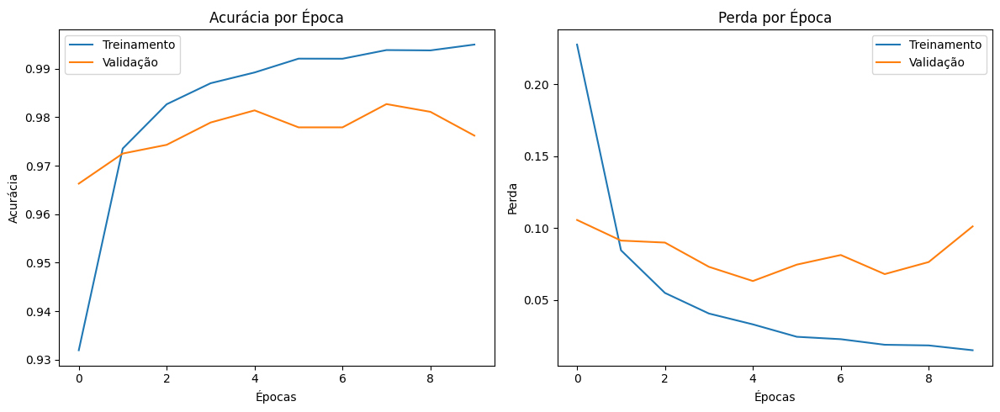

In [ ]:
# Mostrar gráfico do histórico de acurácia do modelo entre as epocas e o grafico de perdas
# Plotar a acurácia
plt.figure(figsize=(12, 5))
plt.subplot(1, 2, 1)
plt.plot(history.history['accuracy'], label='Treinamento')
plt.plot(history.history['val_accuracy'], label='Validação')
plt.title('Acurácia por Época')
plt.xlabel('Épocas')
plt.ylabel('Acurácia')
plt.legend()
# Plotar a perda
plt.subplot(1, 2, 2)
plt.plot(history.history['loss'], label='Treinamento')
plt.plot(history.history['val_loss'], label='Validação')
plt.title('Perda por Época')
plt.xlabel('Épocas')
plt.ylabel('Perda')
plt.legend()
plt.tight_layout()
plt.show()

313/313 ━━━━━━━━━━━━━━━━━━━━ 1s 4ms/step


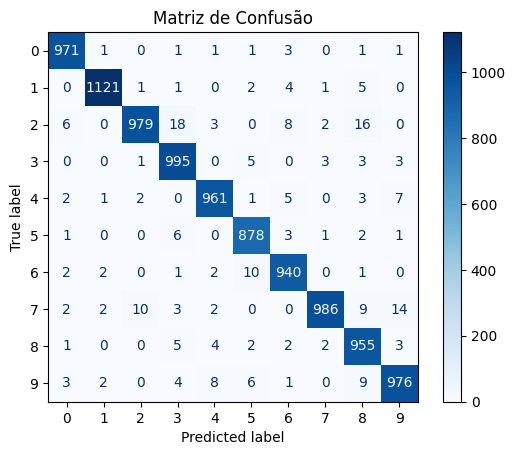

In [ ]:
#Gerar predict e avaliar com matriz de confusão

import numpy as np
from sklearn.metrics import confusion_matrix, ConfusionMatrixDisplay
import matplotlib.pyplot as plt

# Obter previsões do modelo
y_pred_prob = model.predict(x_test) # Retorna probabilidades

# Converter para rótulos preditos
y_pred = np.argmax(y_pred_prob, axis=1)

# Converter rótulos reais (se estiverem one-hot encoded)
y_true = np.argmax(y_test,axis=1)

# Gerar matriz de confusão
cm = confusion_matrix(y_true, y_pred)

# Exibir a matriz de confusão com rótulos
disp = ConfusionMatrixDisplay(confusion_matrix=cm)
disp.plot(cmap='Blues')
plt.title('Matriz de Confusão')
plt.show()

313/313 ━━━━━━━━━━━━━━━━━━━━ 1s 3ms/step
Acurácia: 0.9762
Precisão (macro): 0.9760
Recall (macro): 0.9763
F1-score (macro): 0.9761
Cohen Kappa: 0.9735

Relatório de Classificação: 

              precision    recall  f1-score   support

           0       0.98      0.99      0.99       980
           1       0.99      0.99      0.99      1135
           2       0.99      0.95      0.97      1032
           3       0.96      0.99      0.97      1010
           4       0.98      0.98      0.98       982
           5       0.97      0.98      0.98       892
           6       0.97      0.98      0.98       958
           7       0.99      0.96      0.97      1028
           8       0.95      0.98      0.97       974
           9       0.97      0.97      0.97      1009

    accuracy                           0.98     10000
   macro avg       0.98      0.98      0.98     10000
weighted avg       0.98      0.98      0.98     10000



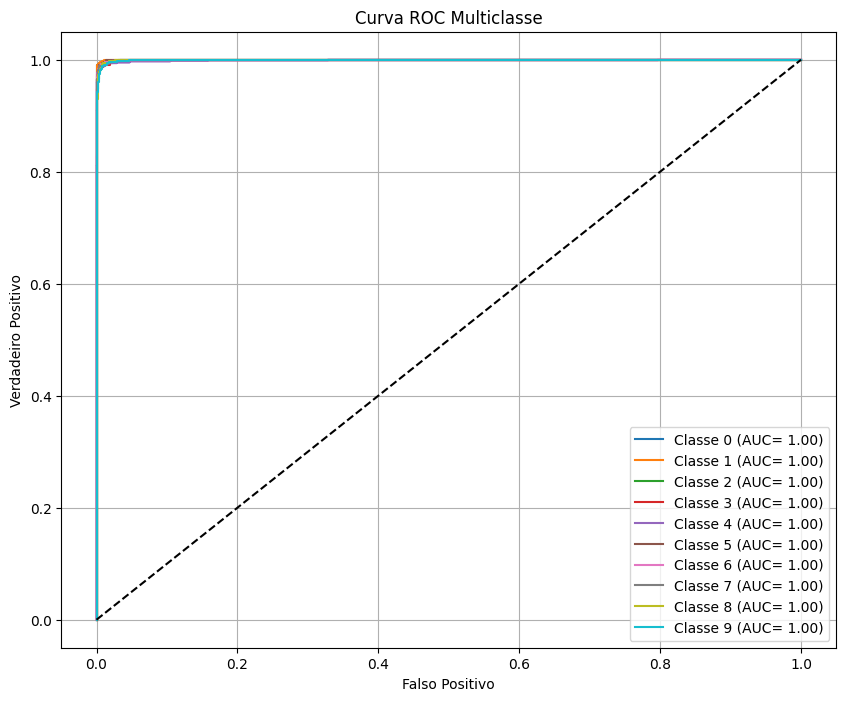

In [ ]:
# Gerar acurácia, precisão, cobertura, F1, Cohen Kappa, PRF e ROC

y_pred_prob = model.predict(x_test) # Probabilidades
y_pred = np.argmax(y_pred_prob, axis=1)# Rótulos previstos
y_true = np.argmax(y_test, axis = 1)

from sklearn.metrics import (accuracy_score, precision_score, recall_score,f1_score, cohen_kappa_score, classification_report,roc_curve, auc, roc_auc_score)
import matplotlib.pyplot as plt
from sklearn.preprocessing import label_binarize

# Acurácia
acc = accuracy_score(y_true, y_pred)
print (f"Acurácia: {acc:.4f}")

# Precisão, Recall e F1 (macro média das classes)
prec = precision_score(y_true, y_pred, average='macro')
rec = recall_score(y_true, y_pred, average='macro')
f1=f1_score(y_true, y_pred, average='macro')
print(f"Precisão (macro): {prec:.4f}")
print (f"Recall (macro): {rec:.4f}")
print(f"F1-score (macro): {f1:.4f}")

# Cohen Kappa
kappa = cohen_kappa_score(y_true, y_pred)
print (f"Cohen Kappa: {kappa:.4f}")

# Relatório completo (PRF por classe)
print("\nRelatório de Classificação: \n")
print(classification_report(y_true, y_pred))

# Binarizar os rótulos para ROC multiclasse
n_classes = y_pred_prob.shape[1]
y_true_bin = label_binarize(y_true, classes=range(n_classes))

# Calcular ROC e AUC para cada classe
fpr = dict()
tpr = dict()
roc_auc = dict()
for i in range(n_classes):
  fpr[i], tpr[i], _ = roc_curve(y_true_bin[:, i], y_pred_prob[:, i])
  roc_auc[i] = auc (fpr[i], tpr[i])

# Plotar curvas ROC
plt.figure(figsize=(10, 8))
for i in range(n_classes):
  plt.plot(fpr[i], tpr[i], label=f"Classe {i} (AUC= {roc_auc[i]:.2f})")
plt.plot([0, 1], [0, 1], 'k--') # linha de referência
plt.xlabel('Falso Positivo')
plt.ylabel('Verdadeiro Positivo')
plt.title('Curva ROC Multiclasse')
plt.legend(loc='lower right')
plt.grid()
plt.show()

In [ ]:
#criar um modelo de rede neural convolucional (CNN)
model = keras.Sequential()
#camada de entrada
model.add(keras.layers.Conv2D(filters=32,
kernel_size=5,
strides = (1,1),
padding='same',
activation=tf.nn.relu,
input_shape=(28,28,1))
)
model.add(keras.layers. MaxPool2D(pool_size=(2,2),
strides=(2,2),
padding='valid')
)
#segunda camada convolucional
model.add(keras.layers.Conv2D(filters=64,
kernel_size=3,
strides=(1,1),
padding='same',
activation=tf.nn.relu)
)
model.add(keras.layers. MaxPool2D(pool_size=(2,2),
strides=(2,2),
padding='valid')
)
#adicionar camada de dropout para tentar evitar overfitting
model.add(keras.layers. Dropout(0.25))
model.add(keras.layers.Flatten())
#camada totalmente conectada
model.add(keras.layers. Dense (units=128, activation=tf.nn.relu))
model.add(keras.layers. Dropout (0.5))
#camada de saida
model.add(keras.layers.Dense (units=10, activation=tf.nn.softmax))
model.summary()

/usr/local/lib/python3.12/dist-packages/keras/src/layers/convolutional/base_conv.py:113: UserWarning: Do not pass an `input_shape`/`input_dim` argument to a layer. When using Sequential models, prefer using an `Input(shape)` object as the first layer in the model instead.
  super().__init__(activity_regularizer=activity_regularizer, **kwargs)


Model: "sequential_9"

┏━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━┓
┃ Layer (type)                    ┃ Output Shape           ┃       Param # ┃
┡━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━┩
│ conv2d_4 (Conv2D)               │ (None, 28, 28, 32)     │           832 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ max_pooling2d_4 (MaxPooling2D)  │ (None, 14, 14, 32)     │             0 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ conv2d_5 (Conv2D)               │ (None, 14, 14, 64)     │        18,496 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ max_pooling2d_5 (MaxPooling2D)  │ (None, 7, 7, 64)       │             0 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dropout_4 (Dropout)             │ (None, 7, 7, 64)       │             0 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ flatten_2 (Flatten)             │ (None, 3136)           │             0 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_16 (Dense)                │ (None, 128)            │       401,536 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dropout_5 (Dropout)             │ (None, 128)            │             0 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_17 (Dense)                │ (None, 10)             │         1,290 │
└─────────────────────────────────┴────────────────────────┴───────────────┘

 Total params: 422,154 (1.61 MB)

 Trainable params: 422,154 (1.61 MB)

 Non-trainable params: 0 (0.00 B)

In [ ]:
%%time
#expansão das dimensoes para os patamares originais
X_train = x_train.reshape (60000, 28, 28,1)
X_test = x_test.reshape(10000,28,28,1)
model.compile(optimizer='adam', loss='categorical_crossentropy', metrics=['accuracy'])
model.fit(x=X_train, y=y_train, epochs=5, validation_data=(X_test, y_test), batch_size=128)

Epoch 1/5
469/469 ━━━━━━━━━━━━━━━━━━━━ 89s 186ms/step - accuracy: 0.8013 - loss: 0.6161 - val_accuracy: 0.9821 - val_loss: 0.0550
Epoch 2/5
469/469 ━━━━━━━━━━━━━━━━━━━━ 89s 189ms/step - accuracy: 0.9701 - loss: 0.1015 - val_accuracy: 0.9878 - val_loss: 0.0361
Epoch 3/5
469/469 ━━━━━━━━━━━━━━━━━━━━ 88s 187ms/step - accuracy: 0.9791 - loss: 0.0701 - val_accuracy: 0.9894 - val_loss: 0.0309
Epoch 4/5
469/469 ━━━━━━━━━━━━━━━━━━━━ 152s 209ms/step - accuracy: 0.9817 - loss: 0.0607 - val_accuracy: 0.9893 - val_loss: 0.0325
Epoch 5/5
469/469 ━━━━━━━━━━━━━━━━━━━━ 89s 189ms/step - accuracy: 0.9844 - loss: 0.0527 - val_accuracy: 0.9903 - val_loss: 0.0281
CPU times: user 11min 18s, sys: 7.52 s, total: 11min 25s
Wall time: 9min 19s


In [ ]:
test_loss, test_acc=model.evaluate(x=X_test,y=y_test)
print("Acurácia do teste da CNN: %.2f"%test_acc)
print("Perda do teste da CNN: %.2f"%test_loss)

313/313 ━━━━━━━━━━━━━━━━━━━━ 6s 19ms/step - accuracy: 0.9888 - loss: 0.0324
Acurácia do teste da CNN: 0.99
Perda do teste da CNN: 0.03


In [ ]:
model.save('./model/final_CNN_model.h5')
#model.save('./model/final_CNN_model.keras')
#keras.saving.save_model(model, 'final_CNN_model.keras')

In [ ]:
from tensorflow.keras.models import load_model
from tensorflow.keras.activations import softmax
# Define custom_objects to map the problematic identifier to the correct function
custom_objects = {'softmax_v2': softmax}
new_model = load_model('./model/final_CNN_model.h5', custom_objects=custom_objects)
new_model.summary()

Model: "sequential_9"

┏━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━┓
┃ Layer (type)                    ┃ Output Shape           ┃       Param # ┃
┡━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━┩
│ conv2d_4 (Conv2D)               │ (None, 28, 28, 32)     │           832 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ max_pooling2d_4 (MaxPooling2D)  │ (None, 14, 14, 32)     │             0 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ conv2d_5 (Conv2D)               │ (None, 14, 14, 64)     │        18,496 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ max_pooling2d_5 (MaxPooling2D)  │ (None, 7, 7, 64)       │             0 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dropout_4 (Dropout)             │ (None, 7, 7, 64)       │             0 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ flatten_2 (Flatten)             │ (None, 3136)           │             0 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_16 (Dense)                │ (None, 128)            │       401,536 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dropout_5 (Dropout)             │ (None, 128)            │             0 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_17 (Dense)                │ (None, 10)             │         1,290 │
└─────────────────────────────────┴────────────────────────┴───────────────┘

 Total params: 422,156 (1.61 MB)

 Trainable params: 422,154 (1.61 MB)

 Non-trainable params: 0 (0.00 B)

 Optimizer params: 2 (12.00 B)

In [ ]:
#from tensorflow.keras.models import load_model
#new_model = load_model('./model/final_CNN_model.h5')
#new_model.summary()

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 115ms/step
resultados da PREVISÃO das 20 primeiras imagens do conjunto de teste
7,2,1,0,4,	
1,4,9,5,9,	
0,6,9,0,1,	
5,9,7,3,4,	
9,6,6,5,4,	
0,7,4,0,1,	
primeiras 20 primeiras imagens do conjunto de teste


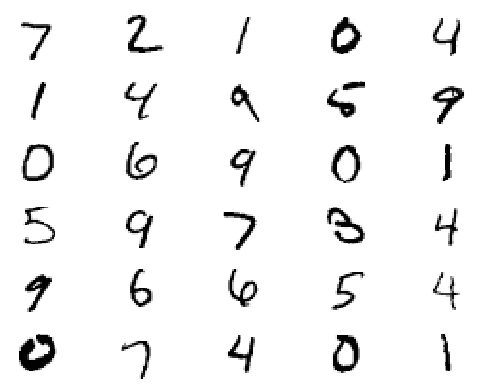

In [ ]:
#visualize os resultados da saíde do conjunto de testes
%matplotlib inline
def res_visual(n):
  #faça predição no conjunto de testes usando new_model
  final_opt_a=np.argmax(model.predict(X_test [0:n]), axis = - 1)
  #print(final_opt_a)
  fig, ax = plt.subplots (nrows=int(n/5), ncols=5)
  ax = ax.flatten()
  print('resultados da PREVISÃO das 20 primeiras imagens do conjunto de teste')
  for i in range(n):
    print(final_opt_a[i], end=',')
    if int((i+1)%5) == 0:
      print('\t')
    #vendo as imagens do banco
    img = X_test[i].reshape((28,28))
    plt.axis("off")
    ax[i].imshow(img, cmap='Greys', interpolation='nearest')
    ax[i].axis("off")
  print('primeiras 20 primeiras imagens do conjunto de teste')

res_visual(30)

In [ ]:
!pip install fastapi uvicorn pyngrok

In [ ]:
from google.colab import files
files.upload()

Saving final_CNN_model.h5 to final_CNN_model.h5


{'final_CNN_model.h5': b'\x89HDF\r\n\x1a\n\x00\x00\x00\x00\x00\x08\x08\x00\x04\x00\x10\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\xff\xff\xff\xff\xff\xff\xff\xff\x10\xeeM\x00\x00\x00\x00\x00\xff\xff\xff\xff\xff\xff\xff\xff\x00\x00\x00\x00\x00\x00\x00\x00`\x00\x00\x00\x00\x00\x00\x00\x01\x00\x00\x00\x00\x00\x00\x00\x88\x00\x00\x00\x00\x00\x00\x00\xa8\x02\x00\x00\x00\x00\x00\x00\x01\x00\x06\x00\x01\x00\x00\x00\x18\x00\x00\x00\x00\x00\x00\x00\x10\x00\x10\x00\x00\x00\x00\x00 \x03\x00\x00\x00\x00\x00\x00P\x01\x00\x00\x00\x00\x00\x00TREE\x00\x00\x01\x00\xff\xff\xff\xff\xff\xff\xff\xff\xff\xff\xff\xff\xff\xff\xff\xff\x00\x00\x00\x00\x00\x00\x00\x00\x00(\x00\x00\x00\x00\x00\x00\x18\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\

In [ ]:
%%writefile api.py
from fastapi import FastAPI, File, UploadFile, HTTPException
from fastapi.middleware.cors import CORSMiddleware
from fastapi.responses import JSONResponse
import numpy as np
import tensorflow as tf
from PIL import Image
import io
import os
from tensorflow.keras.activations import softmax

# Inicia API
app = FastAPI(title="MNIST Digit Recognition API")

# Habilitar CORS para permitir requisições de qualquer origem
app.add_middleware(
    CORSMiddleware,
    allow_origins=["*"],
    allow_credentials=True,
    allow_methods=["*"],
    allow_headers=["*"],
)

# -------------------------------
# Carregar o modelo
# -------------------------------
MODEL_PATH = "./model/final_CNN_model.h5"
if not os.path.exists(MODEL_PATH):
    MODEL_PATH = "final_CNN_model.h5"

try:
    # Carregar modelo com custom_objects para softmax_v2 se necessário
    custom_objects = {'softmax_v2': softmax}
    model = tf.keras.models.load_model(MODEL_PATH, custom_objects=custom_objects, compile=False)
    model.compile(optimizer='adam', loss='categorical_crossentropy', metrics=['accuracy'])
    print(f"Modelo carregado com sucesso de: {MODEL_PATH}")
except Exception as e:
    print(f"Erro ao carregar modelo: {e}")
    model = None

# Tamanho correto da imagem MNIST: 28x28
IMG_SIZE = 28

@app.get("/")
def root():
    return {
        "message": "API funcionando!",
        "endpoints": {
            "predict": "/predict",
            "docs": "/docs"
        },
        "model_loaded": model is not None
    }

@app.post("/predict")
async def predict(file: UploadFile = File(...)):
    if model is None:
        raise HTTPException(status_code=500, detail="Modelo não foi carregado")
    
    # Validar tipo de arquivo
    if not file.content_type.startswith('image/'):
        raise HTTPException(status_code=400, detail="Arquivo deve ser uma imagem")
    
    try:
        # Ler imagem enviada
        contents = await file.read()
        image = Image.open(io.BytesIO(contents))

        # Converter para grayscale (L = luminância, escala de cinza)
        image = image.convert("L")

        # Redimensionar para entrada do modelo MNIST (28x28)
        image = image.resize((IMG_SIZE, IMG_SIZE))

        # Converter para array numpy e normalizar para [0, 1]
        img_array = np.array(image).astype("float32") / 255.0

        # Inverter cores se necessário (MNIST tem fundo preto e dígito branco)
        # Se a imagem tiver fundo branco, inverter
        if img_array.mean() > 0.5:
            img_array = 1.0 - img_array

        # Adicionar dimensões: batch e canal (1, 28, 28, 1)
        img_array = np.expand_dims(img_array, axis=0)  # Adiciona batch
        img_array = np.expand_dims(img_array, axis=-1)  # Adiciona canal

        # Predição
        preds = model.predict(img_array, verbose=0)
        preds_list = preds[0].tolist()

        # Classe com maior probabilidade
        predicted_class = int(np.argmax(preds))
        confidence = float(np.max(preds))

        # Criar dicionário com probabilidades de cada classe
        class_probabilities = {
            str(i): round(prob, 4) 
            for i, prob in enumerate(preds_list)
        }

        return {
            "success": True,
            "predicted_class": predicted_class,
            "confidence": round(confidence, 4),
            "class_probabilities": class_probabilities,
            "all_probabilities": preds_list
        }
    
    except Exception as e:
        raise HTTPException(status_code=400, detail=f"Erro ao processar imagem: {str(e)}")

@app.get("/health")
def health_check():
    return {
        "status": "healthy",
        "model_loaded": model is not None
    }


Overwriting api.py


In [ ]:
from pyngrok import ngrok

# Coloque seu token AQUI
ngrok.set_auth_token("35fHeE0pWDxwwpGaFE9sUnJmZS7_7kWfjgrVqc5Y5LGLRAZS5")

# Abre o túnel para a porta 8000
public_url = ngrok.connect(8000)
public_url


<NgrokTunnel: "https://tealess-bequeathable-mayola.ngrok-free.dev" -> "http://localhost:8000">

In [ ]:
!uvicorn api:app --host 0.0.0.0 --port 8000

2025-11-18 19:39:02.375385: E external/local_xla/xla/stream_executor/cuda/cuda_fft.cc:467] Unable to register cuFFT factory: Attempting to register factory for plugin cuFFT when one has already been registered
E0000 00:00:1763494742.414511   30150 cuda_dnn.cc:8579] Unable to register cuDNN factory: Attempting to register factory for plugin cuDNN when one has already been registered
E0000 00:00:1763494742.428969   30150 cuda_blas.cc:1407] Unable to register cuBLAS factory: Attempting to register factory for plugin cuBLAS when one has already been registered
W0000 00:00:1763494742.459202   30150 computation_placer.cc:177] computation placer already registered. Please check linkage and avoid linking the same target more than once.
W0000 00:00:1763494742.459263   30150 computation_placer.cc:177] computation placer already registered. Please check linkage and avoid linking the same target more than once.
W0000 00:00:1763494742.459272   30150 computation_placer.cc:177] computation placer alr

In [ ]:
from google.colab import drive
drive.mount('/content/drive')

Drive already mounted at /content/drive; to attempt to forcibly remount, call drive.mount("/content/drive", force_remount=True).
